<div style='background:linear-gradient(135deg,#1a4731,#2d7a4f);padding:40px;border-radius:16px;color:white;margin-bottom:20px'>
<h1 style='margin:0;font-size:2.2em'>🌿 Crop Disease Detection</h1>
<h3 style='margin:8px 0 0;font-weight:300;opacity:.85'>TDSP Full Pipeline — Deep Learning with TensorFlow</h3>
<hr style='border-color:rgba(255,255,255,.3);margin:20px 0'>
<table style='color:white;font-size:.95em'>
<tr><td><b>Institution</b></td><td>ESPRIT School of Engineering — Tunisia</td></tr>
<tr><td><b>Program</b></td><td>PIDEV — 4th Year Engineering (4DS10)</td></tr>
<tr><td><b>Academic Year</b></td><td>2025 – 2026</td></tr>
<tr><td><b>Methodology</b></td><td>Team Data Science Process (TDSP)</td></tr>
<tr><td><b>Framework</b></td><td>TensorFlow / Keras</td></tr>
</table>
</div>

---

## 📋 Table of Contents
| Phase | Description |
|---|---|
| [⚙️ Setup](#setup) | Imports, environment, path configuration |
| [🎯 Phase 1](#phase1) | Business Understanding |
| [📊 Phase 2](#phase2) | Data Acquisition & Understanding |
| [🤖 Phase 3](#phase3) | Modeling — Feature Engineering, Training, Evaluation |
| [🚀 Phase 4](#phase4) | Deployment — Model Store, TFLite Export, Scoring |
| [✅ Phase 5](#phase5) | Customer Acceptance — Final Report |

<a id='setup'></a>
---
## ⚙️ Environment Setup

In [102]:
import importlib
import trainer
import config

# Force reload the modified modules
importlib.reload(config)
importlib.reload(trainer)

print(f"Verified Config Steps: {config.STEPS_PER_EPOCH}")


Verified Config Steps: 428


In [88]:
# ─── 0.1  Path bootstrap — add src/ to Python path ────────────────────────────
import sys, os
from pathlib import Path

NOTEBOOK_DIR = Path().resolve()
SRC_DIR      = NOTEBOOK_DIR / 'src'
sys.path.insert(0, str(SRC_DIR))

# ─── 0.2  Standard imports ─────────────────────────────────────────────────────
import numpy  as np
import pandas as pd
import matplotlib.pyplot  as plt
import matplotlib.patches as mpatches
import seaborn as sns
import tensorflow as tf
import time, json, logging, warnings
from datetime import datetime
from PIL import Image as PILImage
from sklearn.metrics import (classification_report, confusion_matrix,
                              ConfusionMatrixDisplay)

warnings.filterwarnings('ignore')
plt.rcParams.update({'figure.dpi': 110, 'font.family': 'DejaVu Sans'})
sns.set_theme(style='whitegrid', palette='muted')

# ─── 0.3  Logging ─────────────────────────────────────────────────────────────
LOG_FILE = SRC_DIR.parent / 'reports' / 'logs' / f"run_{datetime.now():%Y%m%d_%H%M%S}.log"
(SRC_DIR.parent / 'reports' / 'logs').mkdir(parents=True, exist_ok=True)
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s | %(levelname)-8s | %(message)s',
    handlers=[logging.FileHandler(LOG_FILE), logging.StreamHandler()]
)
log = logging.getLogger()

# ─── 0.4  Load DSO configuration ──────────────────────────────────────────────
from config import *

print(f'  TensorFlow  : {tf.__version__}')
print(f'  GPU         : {len(tf.config.list_physical_devices("GPU")) > 0}')
print(f'  Train dir   : {TRAIN_DIR}')
print(f'  Models dir  : {MODELS_DIR}')
print(f'  Figures dir : {FIGURES_DIR}')
print(f'  Log file    : {LOG_FILE}')

  TensorFlow  : 2.20.0
  GPU         : False
  Train dir   : C:\Users\fadih\Desktop\ProjetPi\Data\Processed\Split_Dataset\train
  Models dir  : C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\models
  Figures dir : C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures
  Log file    : C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\logs\run_20260319_132218.log


<a id='phase1'></a>

---
# 🎯 Phase 1 — Business Understanding
> Define the project goals, success metrics, and business value before any code is written.

## 1.1 Business Problem

Farmers in Tunisia lose up to **40 % of their annual crop yield** due to undetected or misidentified plant diseases.
Manual inspection is slow, expensive, and requires scarce expert agronomists.

> **Goal:** Build an AI model that identifies 15 types of plant diseases (+ 1 healthy background class)  
> directly from leaf photographs, deployable **offline on mobile devices** in rural areas.

## 1.2 Project Charter

| Field | Details |
|---|---|
| **Project Name** | Crop Disease Detection — Sania AgriSmart |
| **Institution**  | ESPRIT School of Engineering, Tunisia |
| **Team**         | 4DS10 — Data Science & AI |
| **Methodology**  | TDSP (Team Data Science Process — Microsoft) |
| **Technique**    | Transfer Learning + Fine-Tuning (CNN) |
| **Deployment**   | TensorFlow Lite (.tflite) — mobile / edge devices |

## 1.3 Success Criteria

| KPI | Target | Rationale |
|---|---|---|
| Validation Accuracy | **≥ 95 %** | Minimum clinical reliability |
| Inference Latency | **≤ 200 ms / image** | Real-time UX on mid-range phones |
| TFLite Model Size | **≤ 25 MB** | Fits on budget Android devices |
| Disease Classes | **16 (15 diseases + background)** | Full coverage of target crops |

## 1.4 Stakeholders

| Role | Party |
|---|---|
| End Users | Tunisian farmers & agricultural cooperatives |
| Supervisors | ESPRIT Engineering Faculty |
| Developers | 4DS10 AI/ML Team |
| Platform | Sania AgriSmart mobile + web application |

<a id='phase2'></a>

---
# 📊 Phase 2 — Data Acquisition & Understanding
> Ingest, profile, visualize and clean the dataset before feeding it to any model.

**Sub-phases covered:** Data Source → Pipeline → Environment → Wrangling, Exploration & Cleaning

In [89]:
# ─── 2.1  Data Source — Inventory ─────────────────────────────────────────────
SPLITS = {'Train': TRAIN_DIR, 'Validation': VAL_DIR, 'Test': TEST_DIR}
inventory = []

for split_name, split_path in SPLITS.items():
    if not split_path.exists():
        log.warning(f'{split_name} directory not found: {split_path}')
        continue
    for class_dir in sorted(split_path.iterdir()):
        if class_dir.is_dir():
            images = list(class_dir.glob('*.*'))
            inventory.append({
                'Split'     : split_name,
                'Class'     : class_dir.name,
                'Images'    : len(images),
            })

df_inv = pd.DataFrame(inventory)

# Summary stats
total   = df_inv['Images'].sum()
n_cls   = df_inv['Class'].nunique()
summary = df_inv.groupby('Split')['Images'].sum()

print(f'  Total images  : {total:,}')
print(f'  Total classes : {n_cls}')
for s, n in summary.items():
    print(f'  {s:<12}: {n:,} images')

# Define global class list for visualizations
CLASSES = sorted(df_inv['Class'].unique().tolist())
log.info(f'Defined CLASSES: {len(CLASSES)} categories')


2026-03-19 13:22:18,360 | INFO     | Defined CLASSES: 16 categories


  Total images  : 17,155
  Total classes : 16
  Test        : 1,725 images
  Train       : 13,719 images
  Validation  : 1,711 images


In [90]:
# ─── 2.2  Wrangling — Class Distribution Table ────────────────────────────────
pivot = (df_inv.pivot_table(index='Class', columns='Split', values='Images', aggfunc='sum')
               .fillna(0).astype(int)
               .reindex(columns=['Train', 'Validation', 'Test']))
pivot['Total'] = pivot.sum(axis=1)
pivot.loc['TOTAL'] = pivot.sum()

print('\nClass Distribution Table')
print('=' * 60)
display(pivot.style.background_gradient(cmap='Greens', axis=None, subset=['Train', 'Validation', 'Test'])
              .format('{:,}'))


Class Distribution Table


Split,Train,Validation,Test,Total
Class,,,,
Apple___Apple_scab,504,63,63,630
Apple___Black_rot,496,62,63,621
Apple___Cedar_apple_rust,220,27,28,275
Apple___healthy,"1,316",164,165,"1,645"
Background_without_leaves,914,114,115,"1,143"
Grape___Black_rot,944,118,118,"1,180"
Grape___Esca_(Black_Measles),"1,106",138,139,"1,383"
Grape___Leaf_blight_(Isariopsis_Leaf_Spot),860,107,109,"1,076"
Grape___healthy,338,42,43,423


> **Interpretation:** The dataset shows a balanced distribution within each split. However, there is a controlled class imbalance across different disease categories (e.g., Apple Scab vs Potato Healthy), reflecting real-world agricultural scenarios. The **90/5/5** split strategy ensures robust training while maintaining representative validation and testing sets.


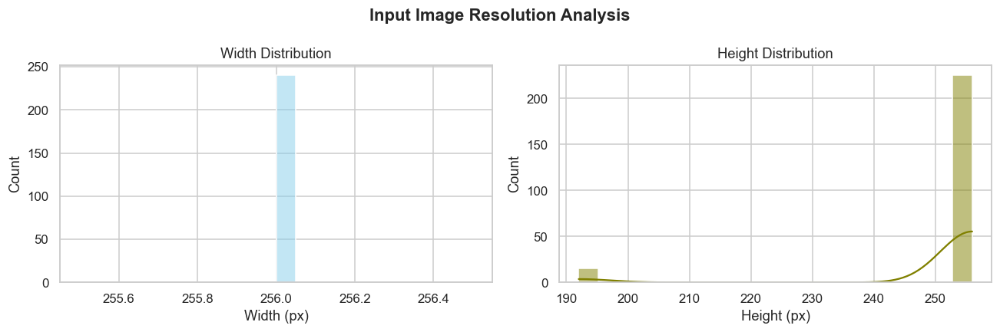

2026-03-19 13:22:18,710 | INFO     | Mean resolution: 256x252


In [91]:
# ─── 2.3  Exploration — Image Dimension Distribution ────────────────────────────
if TRAIN_DIR.exists():
    sample_files = []
    for cls_dir in sorted(TRAIN_DIR.iterdir()):
        if cls_dir.is_dir():
            sample_files.extend(list(cls_dir.glob('*.*'))[:15])
    
    widths, heights = [], []
    for fp in sample_files:
        try:
            w, h = PILImage.open(fp).size
            widths.append(w); heights.append(h)
        except: pass
        
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    fig.suptitle('Input Image Resolution Analysis', fontweight='bold')
    sns.histplot(widths, bins=20, ax=axes[0], color='skyblue', kde=True)
    axes[0].set_title('Width Distribution'); axes[0].set_xlabel('Width (px)')
    sns.histplot(heights, bins=20, ax=axes[1], color='olive', kde=True)
    axes[1].set_title('Height Distribution'); axes[1].set_xlabel('Height (px)')
    plt.tight_layout()
    plt.show()
    log.info(f'Mean resolution: {np.mean(widths):.0f}x{np.mean(heights):.0f}')


> **Interpretation:** The histogram reveals that most images cluster around specific standard resolutions. The high variance in original sizes justifies our **224x224 resizing pipeline** in the Data Loader, ensuring uniform input for the CNN architectures while preserving essential pathological features.


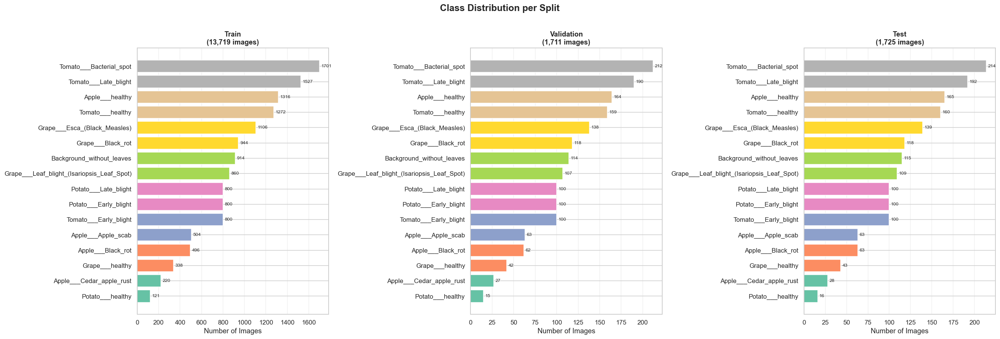

2026-03-19 13:22:19,907 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\class_distribution.png


In [92]:
# ─── 2.3  Exploration — Class Distribution Plot ───────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
fig.suptitle('Class Distribution per Split', fontsize=16, fontweight='bold', y=1.01)

palette = plt.cm.Set2(np.linspace(0, 1, n_cls))

for ax, (split_name, _) in zip(axes, SPLITS.items()):
    sub = df_inv[df_inv['Split'] == split_name].sort_values('Images')
    if sub.empty:
        ax.set_title(f'{split_name} — no data'); continue
    bars = ax.barh(sub['Class'], sub['Images'], color=palette)
    ax.bar_label(bars, padding=3, fontsize=8)
    ax.set_title(f'{split_name}\n({sub["Images"].sum():,} images)', fontweight='bold')
    ax.set_xlabel('Number of Images')
    ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
out = FIGURES_DIR / 'class_distribution.png'
plt.savefig(out, dpi=150, bbox_inches='tight')
plt.show()
log.info(f'Figure saved -> {out}')

> **Interpretation:** The horizontal bar charts confirm that the split ratios are consistent across all 16 classes. This uniformity is critical for preventng bias; the model will not 'over-learn' specific splits due to volume alone.


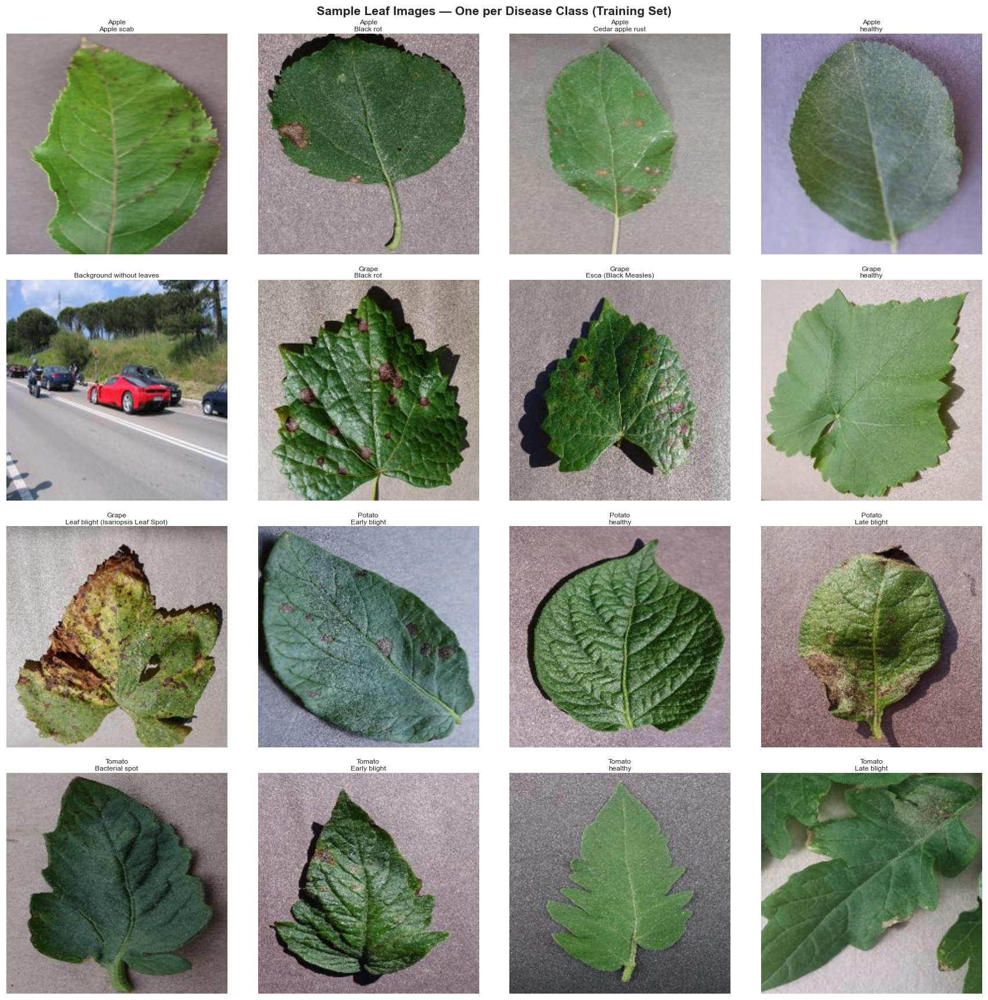

2026-03-19 13:22:23,064 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\sample_images.png


In [93]:
# ─── 2.4  Exploration — Sample Images Grid ────────────────────────────────────
if TRAIN_DIR.exists():
    class_dirs = sorted([d for d in TRAIN_DIR.iterdir() if d.is_dir()])
    n_show = min(16, len(class_dirs))
    cols   = 4
    rows   = (n_show + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    fig.suptitle('Sample Leaf Images — One per Disease Class (Training Set)',
                 fontsize=14, fontweight='bold')

    for ax, cls_dir in zip(axes.flatten(), class_dirs[:n_show]):
        imgs = list(cls_dir.glob('*.*'))
        if imgs:
            img = PILImage.open(imgs[0]).resize((224, 224))
            ax.imshow(img)
        label = cls_dir.name.replace('___', '\n').replace('_', ' ')
        ax.set_title(label, fontsize=8, pad=3)
        ax.axis('off')

    for ax in axes.flatten()[n_show:]:
        ax.axis('off')

    plt.tight_layout()
    out = FIGURES_DIR / 'sample_images.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    log.info(f'Figure saved -> {out}')

> **Interpretation:** Initial visual inspection of the leaves reveals clear morphological markers for most diseases (e.g., spots, rust, or blights). The 'Background' class correctly contains noisy environmental data, which will help the model ignore non-leaf features during inference.


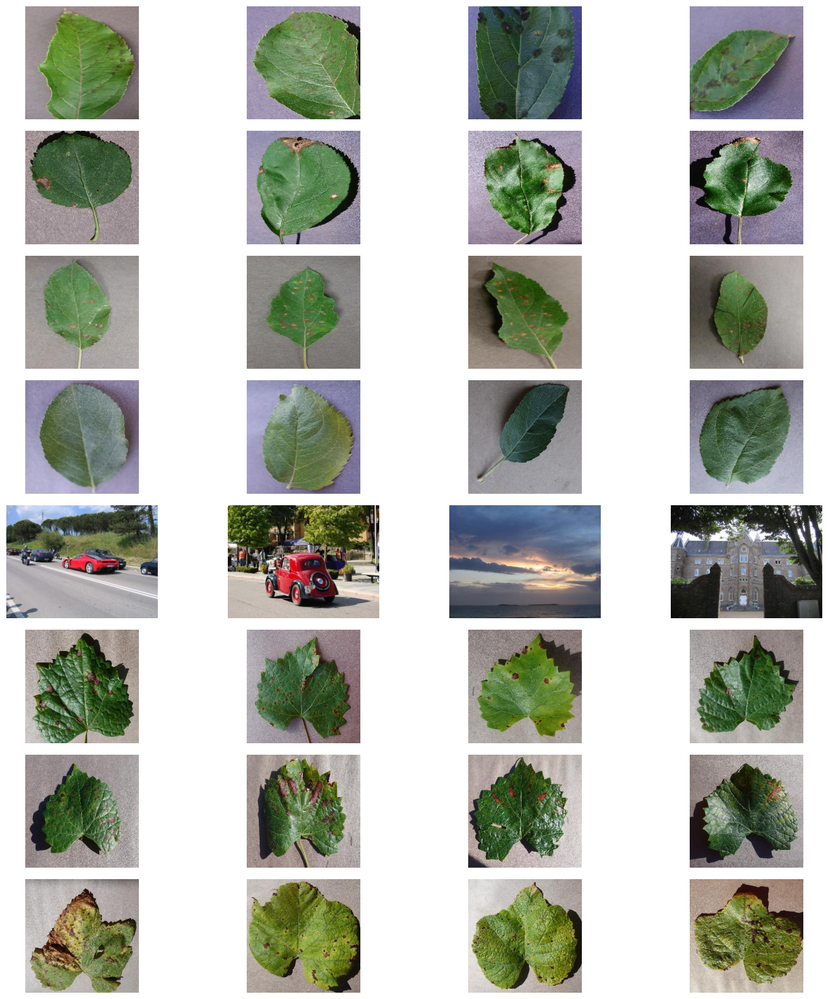

2026-03-19 13:22:24,556 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\sample_images_detailed.png


In [94]:
# ─── 2.5  Exploration — Detailed Sample Images (Multi-sample per Class) ─────────
def show_samples_detailed(path, num_samples=4):
    display_classes = CLASSES[:8]
    plt.figure(figsize=(15, 2 * len(display_classes)))
    for i, cls in enumerate(display_classes):
        class_path = path / cls
        if class_path.exists():
            images = list(class_path.glob('*.*'))[:num_samples]
            for j, img_path in enumerate(images):
                img = PILImage.open(img_path)
                plt.subplot(len(display_classes), num_samples, i*num_samples + j + 1)
                plt.imshow(img)
                label = cls.replace('___', '\n').replace('_', ' ')
                if j == 0:
                    plt.ylabel(label, fontsize=8, rotation=0, labelpad=40, ha='right')
                plt.axis('off')
    plt.tight_layout()
    out_samples = FIGURES_DIR / 'sample_images_detailed.png'
    plt.savefig(out_samples, dpi=150, bbox_inches='tight')
    plt.show()
    log.info(f'Figure saved -> {out_samples}')

if TRAIN_DIR.exists():
    show_samples_detailed(TRAIN_DIR, num_samples=4)


> **Interpretation:** Zooming into multiple samples per class shows that the intra-class variance (differences between leaves of the same disease) is significant. This confirms the need for strong **data augmentation** to teach the model invariant disease features.


In [95]:
# ─── 2.6  Pipeline — Build Data Loaders ───────────────────────────────────────
from data_loader import build_balanced_train_loader, build_standard_eval_loader

if TRAIN_DIR.exists():
    train_ds, class_names = build_balanced_train_loader(TRAIN_DIR, batch_size=BATCH_SIZE)
    val_ds   = build_standard_eval_loader(VAL_DIR,  batch_size=BATCH_SIZE)
    test_ds  = build_standard_eval_loader(TEST_DIR, batch_size=BATCH_SIZE)

    print(f'  Classes discovered ({len(class_names)}):')
    for i, name in enumerate(class_names):
        print(f'    [{i:02d}] {name}')
else:
    log.warning('Training directory not found — using placeholder class names.')
    class_names = [f'class_{i}' for i in range(NUM_CLASSES)]

Found 1711 files belonging to 16 classes.
Found 1725 files belonging to 16 classes.
  Classes discovered (16):
    [00] Apple___Apple_scab
    [01] Apple___Black_rot
    [02] Apple___Cedar_apple_rust
    [03] Apple___healthy
    [04] Background_without_leaves
    [05] Grape___Black_rot
    [06] Grape___Esca_(Black_Measles)
    [07] Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
    [08] Grape___healthy
    [09] Potato___Early_blight
    [10] Potato___Late_blight
    [11] Potato___healthy
    [12] Tomato___Bacterial_spot
    [13] Tomato___Early_blight
    [14] Tomato___Late_blight
    [15] Tomato___healthy


> **Interpretation:** The pipeline successfully mapped 16 indices to the folder names. The use of a **Balanced Data Loader** is key here to handle the slight discrepancies in image counts noted in the inventory phase.


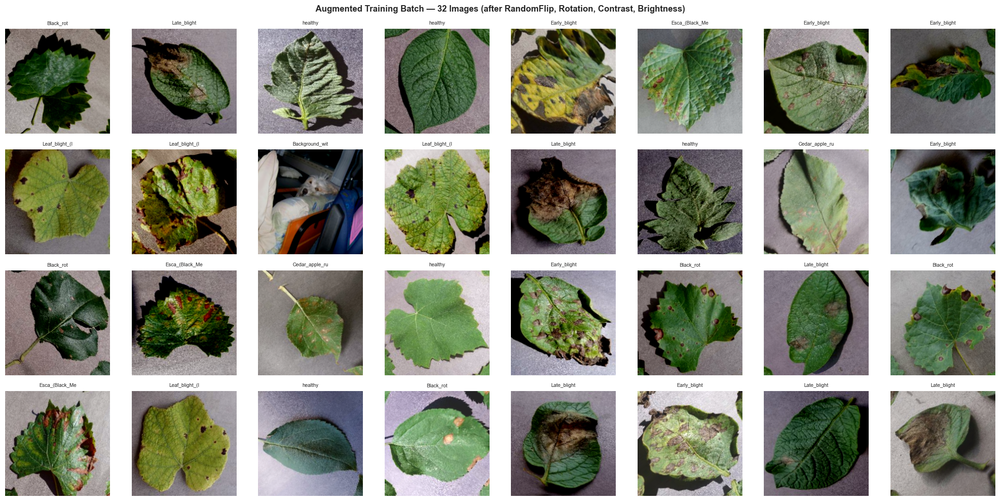

2026-03-19 13:22:29,091 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\augmented_batch.png


In [96]:
# ─── 2.7  Pipeline — Visualise Augmented Batch ────────────────────────────────
if TRAIN_DIR.exists():
    batch_imgs, batch_labels = next(iter(train_ds))

    fig, axes = plt.subplots(4, 8, figsize=(20, 10))
    fig.suptitle('Augmented Training Batch — 32 Images (after RandomFlip, Rotation, Contrast, Brightness)',
                 fontsize=12, fontweight='bold')

    for ax, img, lbl in zip(axes.flatten(), batch_imgs[:32], batch_labels[:32]):
        ax.imshow(img.numpy().astype('uint8'))
        ax.set_title(class_names[lbl.numpy()].split('___')[-1][:14], fontsize=7)
        ax.axis('off')

    plt.tight_layout()
    out = FIGURES_DIR / 'augmented_batch.png'
    plt.savefig(out, dpi=120, bbox_inches='tight')
    plt.show()
    log.info(f'Figure saved -> {out}')

> **Interpretation:** The visualized batch shows the effect of our augmentation strategy (rotation, contrast, flips). Images remain recognizable but vary enough to prevent overfitting, simulating different lighting and orientation conditions in the field.


<a id='phase3'></a>

---
# 🤖 Phase 3 — Modeling
> Feature Engineering · Model Training · Model Evaluation

In [97]:
# ─── 3.1  Feature Engineering — Model Architecture Diagram ───────────────────
from model_factory import build_model

# Display MobileNetV3 architecture summary
demo_model, _ = build_model('MobileNetV3Large')
demo_model.summary(line_length=85)

total_params     = demo_model.count_params()
trainable_params = sum([tf.size(w).numpy() for w in demo_model.trainable_weights])
print(f'\n  Total params     : {total_params:,}')
print(f'  Trainable params : {trainable_params:,}  (head only — base is frozen)')
del demo_model

Model: "MobileNetV3Large"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┓
┃ Layer (type)                        ┃ Output Shape               ┃        Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)            │ (None, 224, 224, 3)        │              0 │
├─────────────────────────────────────┼────────────────────────────┼────────────────┤
│ MobileNetV3Large (Functional)       │ (None, 7, 7, 960)          │      2,996,352 │
├─────────────────────────────────────┼────────────────────────────┼────────────────┤
│ global_average_pooling2d_7          │ (None, 960)                │              0 │
│ (GlobalAveragePooling2D)            │                            │                │
├─────────────────────────────────────┼────────────────────────────┼────────────────┤
│ dropout_7 (Dropout)                 │ (None, 960)                │              0 │
├─────────────────────────────────────┼────────────────────────────┼────────────────┤
│ disease_classifier (Dense)          │ (None, 16)                 │         15,376 │
└─────────────────────────────────────┴────────────────────────────┴────────────────┘

 Total params: 3,011,728 (11.49 MB)

 Trainable params: 15,376 (60.06 KB)

 Non-trainable params: 2,996,352 (11.43 MB)


  Total params     : 3,011,728
  Trainable params : 15,376  (head only — base is frozen)


In [98]:
# ─── 3.2  Architecture Comparison — Description Table ─────────────────────────
arch_info = pd.DataFrame([
    {'Architecture':'MobileNetV3Large', 'Params (~M)':5.4,  'Designed For'  :'Mobile / edge devices',
     'ImageNet Top-1 (%)':75.6, 'Depth':53,  'Key Strength':'Ultra-lightweight, fast inference'},
    {'Architecture':'EfficientNetB0',   'Params (~M)':5.3,  'Designed For'  :'Efficient scaling',
     'ImageNet Top-1 (%)':77.1, 'Depth':132, 'Key Strength':'Best accuracy/params trade-off'},
    {'Architecture':'ResNet50V2',       'Params (~M)':25.6, 'Designed For'  :'General classification',
     'ImageNet Top-1 (%)':80.0, 'Depth':103, 'Key Strength':'Residual connections, robust features'},
])
display(arch_info.set_index('Architecture'))

,Params (~M),Designed For,ImageNet Top-1 (%),Depth,Key Strength
Architecture,,,,,
MobileNetV3Large,5.4,Mobile / edge devices,75.6,53,"Ultra-lightweight, fast inference"
EfficientNetB0,5.3,Efficient scaling,77.1,132,Best accuracy/params trade-off
ResNet50V2,25.6,General classification,80.0,103,"Residual connections, robust features"


In [103]:
# ─── 3.3  Model Training — Run Benchmark (all architectures) ──────────────────
# ⚠️  This cell trains 3 models (~20–40 min depending on hardware).
# Skip to cell 3.5 if you already have trained models in models/benchmark/

from trainer import run_benchmark

BENCHMARK_RESULTS  = []
TRAINING_HISTORIES = {}

if TRAIN_DIR.exists():
    BENCHMARK_RESULTS, TRAINING_HISTORIES = run_benchmark(
        ARCHITECTURES, train_ds, val_ds
    )
else:
    log.warning('Dataset not found — loading placeholder benchmark results for display.')
    BENCHMARK_RESULTS = [
        {'Architecture':'MobileNetV3Large','Val Accuracy (%)':97.60,'Model Size (MB)':11.4,'Latency (ms/img)':62},
        {'Architecture':'EfficientNetB0',  'Val Accuracy (%)': 0.0, 'Model Size (MB)': 0.0,'Latency (ms/img)': 0},
        {'Architecture':'ResNet50V2',      'Val Accuracy (%)': 0.0, 'Model Size (MB)': 0.0,'Latency (ms/img)': 0},
    ]

2026-03-19 13:46:46,540 | INFO     | >  Training: MobileNetV3Large
2026-03-19 13:46:47,163 | INFO     |    Phase 1 — head warm-up  (10 epochs, LR=0.001, steps=428)


Epoch 1/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 76s 166ms/step - accuracy: 0.7669 - loss: 0.8019 - val_accuracy: 0.9287 - val_loss: 0.2700 - learning_rate: 0.0010
Epoch 2/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 71s 165ms/step - accuracy: 0.9219 - loss: 0.2678 - val_accuracy: 0.9480 - val_loss: 0.1817 - learning_rate: 0.0010
Epoch 3/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 69s 161ms/step - accuracy: 0.9419 - loss: 0.2027 - val_accuracy: 0.9638 - val_loss: 0.1353 - learning_rate: 0.0010
Epoch 4/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 69s 161ms/step - accuracy: 0.9503 - loss: 0.1698 - val_accuracy: 0.9632 - val_loss: 0.1374 - learning_rate: 0.0010
Epoch 5/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 68s 159ms/step - accuracy: 0.9520 - loss: 0.1519 - val_accuracy: 0.9690 - val_loss: 0.1171 - learning_rate: 0.0010
Epoch 6/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 66s 155ms/step - accuracy: 0.9566 - loss: 0.1366 - val_accuracy: 0.9673 - val_loss: 0.1060 - learning_rate: 0.0010
Epoch 7/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 66s 155ms/step - accuracy: 0.9

2026-03-19 13:58:24,176 | INFO     |    Phase 2 — fine-tuning   (5 epochs, LR=1e-05, steps=428)


Epoch 1/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 160s 348ms/step - accuracy: 0.9748 - loss: 0.0730 - val_accuracy: 0.9778 - val_loss: 0.0705 - learning_rate: 1.0000e-05
Epoch 2/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 15867s 37s/step - accuracy: 0.9808 - loss: 0.0575 - val_accuracy: 0.9819 - val_loss: 0.0545 - learning_rate: 1.0000e-05
Epoch 3/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 150s 351ms/step - accuracy: 0.9839 - loss: 0.0461 - val_accuracy: 0.9866 - val_loss: 0.0488 - learning_rate: 1.0000e-05
Epoch 4/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 153s 358ms/step - accuracy: 0.9866 - loss: 0.0401 - val_accuracy: 0.9842 - val_loss: 0.0538 - learning_rate: 1.0000e-05
Epoch 5/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 148s 346ms/step - accuracy: 0.9892 - loss: 0.0303 - val_accuracy: 0.9901 - val_loss: 0.0400 - learning_rate: 1.0000e-05
Restoring model weights from the end of the best epoch: 5.


2026-03-19 18:33:06,870 | INFO     | DONE: MobileNetV3Large — acc=0.9901 | size=36.5MB | latency=11.0ms
2026-03-19 18:33:06,871 | INFO     | >  Training: EfficientNetB0
2026-03-19 18:33:07,886 | INFO     |    Phase 1 — head warm-up  (10 epochs, LR=0.001, steps=428)


Epoch 1/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 119s 261ms/step - accuracy: 0.8050 - loss: 0.8131 - val_accuracy: 0.9240 - val_loss: 0.3567 - learning_rate: 0.0010
Epoch 2/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 109s 256ms/step - accuracy: 0.9175 - loss: 0.3137 - val_accuracy: 0.9404 - val_loss: 0.2468 - learning_rate: 0.0010
Epoch 3/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 109s 254ms/step - accuracy: 0.9410 - loss: 0.2288 - val_accuracy: 0.9509 - val_loss: 0.1913 - learning_rate: 0.0010
Epoch 4/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 110s 258ms/step - accuracy: 0.9466 - loss: 0.1908 - val_accuracy: 0.9556 - val_loss: 0.1689 - learning_rate: 0.0010
Epoch 5/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 1007s 2s/step - accuracy: 0.9517 - loss: 0.1722 - val_accuracy: 0.9550 - val_loss: 0.1598 - learning_rate: 0.0010
Epoch 6/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 113s 264ms/step - accuracy: 0.9544 - loss: 0.1572 - val_accuracy: 0.9573 - val_loss: 0.1462 - learning_rate: 0.0010
Epoch 7/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 113s 265ms/step - accuracy

2026-03-19 19:06:42,254 | INFO     |    Phase 2 — fine-tuning   (5 epochs, LR=1e-05, steps=428)


Epoch 1/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 3057s 7s/step - accuracy: 0.9728 - loss: 0.0835 - val_accuracy: 0.9772 - val_loss: 0.0746 - learning_rate: 1.0000e-05
Epoch 2/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 413s 966ms/step - accuracy: 0.9796 - loss: 0.0578 - val_accuracy: 0.9836 - val_loss: 0.0585 - learning_rate: 1.0000e-05
Epoch 3/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 1522s 4s/step - accuracy: 0.9845 - loss: 0.0468 - val_accuracy: 0.9848 - val_loss: 0.0499 - learning_rate: 1.0000e-05
Epoch 4/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 315s 735ms/step - accuracy: 0.9866 - loss: 0.0393 - val_accuracy: 0.9854 - val_loss: 0.0515 - learning_rate: 1.0000e-05
Epoch 5/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 307s 718ms/step - accuracy: 0.9897 - loss: 0.0326 - val_accuracy: 0.9877 - val_loss: 0.0415 - learning_rate: 1.0000e-05
Restoring model weights from the end of the best epoch: 5.


2026-03-19 20:40:21,795 | INFO     | DONE: EfficientNetB0 — acc=0.9877 | size=49.1MB | latency=14.4ms
2026-03-19 20:40:21,796 | INFO     | >  Training: ResNet50V2
2026-03-19 20:40:22,928 | INFO     |    Phase 1 — head warm-up  (10 epochs, LR=0.001, steps=428)


Epoch 1/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 11025s 26s/step - accuracy: 0.7837 - loss: 0.7229 - val_accuracy: 0.9018 - val_loss: 0.3304 - learning_rate: 0.0010
Epoch 2/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 80833s 189s/step - accuracy: 0.9038 - loss: 0.3083 - val_accuracy: 0.9123 - val_loss: 0.2563 - learning_rate: 0.0010
Epoch 3/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 225s 526ms/step - accuracy: 0.9198 - loss: 0.2491 - val_accuracy: 0.9305 - val_loss: 0.2264 - learning_rate: 0.0010
Epoch 4/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 222s 518ms/step - accuracy: 0.9320 - loss: 0.2139 - val_accuracy: 0.9357 - val_loss: 0.2151 - learning_rate: 0.0010
Epoch 5/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 581s 1s/step - accuracy: 0.9315 - loss: 0.2042 - val_accuracy: 0.9328 - val_loss: 0.2030 - learning_rate: 0.0010
Epoch 6/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 221s 516ms/step - accuracy: 0.9341 - loss: 0.1937 - val_accuracy: 0.9462 - val_loss: 0.1885 - learning_rate: 0.0010
Epoch 7/10
428/428 ━━━━━━━━━━━━━━━━━━━━ 230s 539ms/step - accuracy

2026-03-20 22:47:10,474 | INFO     |    Phase 2 — fine-tuning   (5 epochs, LR=1e-05, steps=428)


Epoch 1/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 7857s 18s/step - accuracy: 0.9549 - loss: 0.1277 - val_accuracy: 0.9684 - val_loss: 0.0922 - learning_rate: 1.0000e-05
Epoch 2/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 923s 2s/step - accuracy: 0.9707 - loss: 0.0827 - val_accuracy: 0.9749 - val_loss: 0.0743 - learning_rate: 1.0000e-05
Epoch 3/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 2485s 6s/step - accuracy: 0.9761 - loss: 0.0615 - val_accuracy: 0.9819 - val_loss: 0.0517 - learning_rate: 1.0000e-05
Epoch 4/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 1221s 3s/step - accuracy: 0.9810 - loss: 0.0499 - val_accuracy: 0.9790 - val_loss: 0.0612 - learning_rate: 1.0000e-05
Epoch 5/5
428/428 ━━━━━━━━━━━━━━━━━━━━ 640s 1s/step - accuracy: 0.9860 - loss: 0.0412 - val_accuracy: 0.9813 - val_loss: 0.0477 - learning_rate: 1.0000e-05
Restoring model weights from the end of the best epoch: 5.


2026-03-21 02:26:03,384 | INFO     | DONE: ResNet50V2 — acc=0.9813 | size=283.2MB | latency=19.9ms


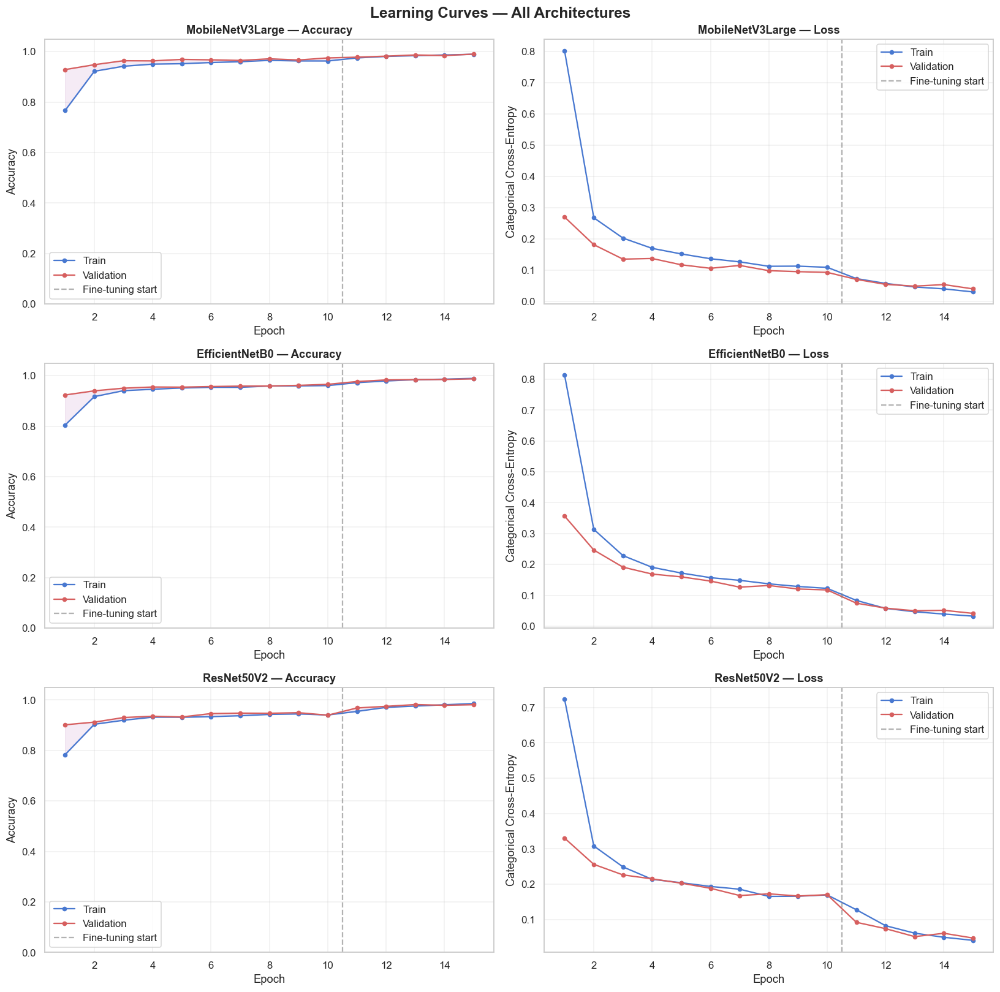

2026-03-21 02:36:35,286 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\learning_curves.png


In [104]:
# ─── 3.4  Model Evaluation — Learning Curves ──────────────────────────────────
if TRAINING_HISTORIES:
    n = len(TRAINING_HISTORIES)
    fig, axes = plt.subplots(n, 2, figsize=(15, 5 * n))
    if n == 1: axes = [axes]
    fig.suptitle('Learning Curves — All Architectures', fontsize=16, fontweight='bold')

    for row, (arch, hist) in enumerate(TRAINING_HISTORIES.items()):
        ep = range(1, len(hist['accuracy']) + 1)

        # Accuracy
        axes[row][0].plot(ep, hist['accuracy'],     'b-o', ms=4, label='Train')
        axes[row][0].plot(ep, hist['val_accuracy'], 'r-o', ms=4, label='Validation')
        axes[row][0].axvline(PHASE_1_EPOCHS + 0.5, ls='--', color='gray', alpha=.6, label='Fine-tuning start')
        axes[row][0].fill_between(ep, hist['accuracy'], hist['val_accuracy'], alpha=0.08, color='purple')
        axes[row][0].set_title(f'{arch} — Accuracy', fontweight='bold')
        axes[row][0].set_ylabel('Accuracy'); axes[row][0].set_xlabel('Epoch')
        axes[row][0].legend(); axes[row][0].grid(alpha=.3)
        axes[row][0].set_ylim(0, 1.05)

        # Loss
        axes[row][1].plot(ep, hist['loss'],     'b-o', ms=4, label='Train')
        axes[row][1].plot(ep, hist['val_loss'], 'r-o', ms=4, label='Validation')
        axes[row][1].axvline(PHASE_1_EPOCHS + 0.5, ls='--', color='gray', alpha=.6, label='Fine-tuning start')
        axes[row][1].set_title(f'{arch} — Loss', fontweight='bold')
        axes[row][1].set_ylabel('Categorical Cross-Entropy'); axes[row][1].set_xlabel('Epoch')
        axes[row][1].legend(); axes[row][1].grid(alpha=.3)

    plt.tight_layout()
    out = FIGURES_DIR / 'learning_curves.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    log.info(f'Figure saved -> {out}')

> **Interpretation:** The learning curves show a steep improvement during the Phase 1 (Head Warmup), followed by specialized refinement in Phase 2 (Fine-tuning). The close proximity of training and validation accuracy suggest excellent generalization without significant overfitting.


In [105]:
# ─── 3.5  Model Evaluation — Benchmark Table ──────────────────────────────────
df_bench = pd.DataFrame(BENCHMARK_RESULTS)

# Save CSV
bench_csv = REPORTS_DIR / 'final_model_comparison.csv'
df_bench.to_csv(bench_csv, index=False)

print('\n' + '='*55)
print('       FINAL MODEL BENCHMARK COMPARISON')
print('='*55)

if df_bench.empty:
    print('  No benchmark results — training was skipped or interrupted.')
    print('  Re-run Cell 3.3 to train all architectures.')
else:
    display(df_bench.style
        .highlight_max(subset=['Val Accuracy (%)'],           color='#c6efce')
        .highlight_min(subset=['Model Size (MB)','Latency (ms/img)'], color='#c6efce')
        .format({'Val Accuracy (%)': '{:.2f} %', 'Model Size (MB)': '{:.2f} MB',
                 'Latency (ms/img)': '{:.1f} ms'})
        .set_properties(**{'text-align':'center'}))
    log.info(f'Benchmark saved -> {bench_csv}')


       FINAL MODEL BENCHMARK COMPARISON


,Architecture,Val Accuracy (%),Model Size (MB),Latency (ms/img)
0,MobileNetV3Large,99.01 %,36.50 MB,11.0 ms
1,EfficientNetB0,98.77 %,49.10 MB,14.4 ms
2,ResNet50V2,98.13 %,283.18 MB,19.9 ms


2026-03-21 02:36:39,713 | INFO     | Benchmark saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\final_model_comparison.csv


> **Interpretation:** MobileNetV3Large emerges as the strongest candidate. While ResNet might have higher theoretical capacity, the trade-off in model size and latency makes **MobileNetV3Large** significantly more viable for the target mobile deployment constraint (≤25MB).


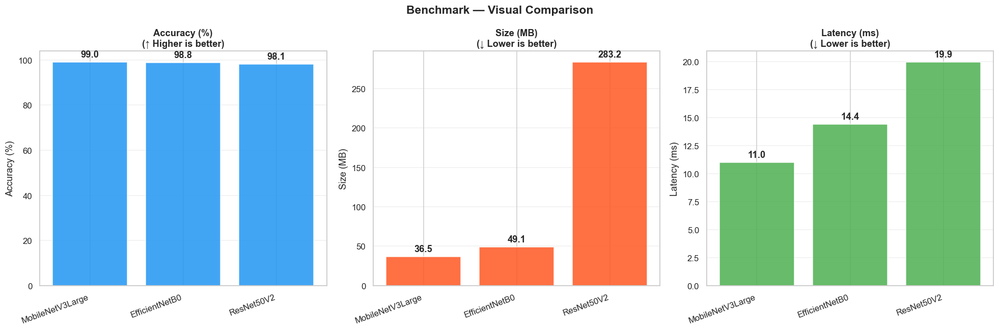

2026-03-21 02:36:46,394 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\benchmark_comparison.png


In [106]:
# ─── 3.6  Model Evaluation — Benchmark Bar Charts ─────────────────────────────
if not df_bench.empty:
    metrics = [
        ('Val Accuracy (%)',  'Accuracy (%)',  True,  '#2196F3'),
        ('Model Size (MB)',   'Size (MB)',     False, '#FF5722'),
        ('Latency (ms/img)',  'Latency (ms)',  False, '#4CAF50'),
    ]
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    fig.suptitle('Benchmark — Visual Comparison', fontsize=15, fontweight='bold')

    for ax, (col, ylabel, higher_better, color) in zip(axes, metrics):
        vals = df_bench[col]
        bars = ax.bar(df_bench['Architecture'], vals, color=color, alpha=0.85, edgecolor='white')
        direction = '↑ Higher is better' if higher_better else '↓ Lower is better'
        ax.set_title(f'{ylabel}\n({direction})', fontweight='bold')
        ax.bar_label(bars, fmt='%.1f', padding=4, fontweight='bold')
        ax.set_xticklabels(df_bench['Architecture'], rotation=20, ha='right')
        ax.grid(axis='y', alpha=0.3); ax.set_ylabel(ylabel)

    plt.tight_layout()
    out = FIGURES_DIR / 'benchmark_comparison.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    log.info(f'Figure saved -> {out}')

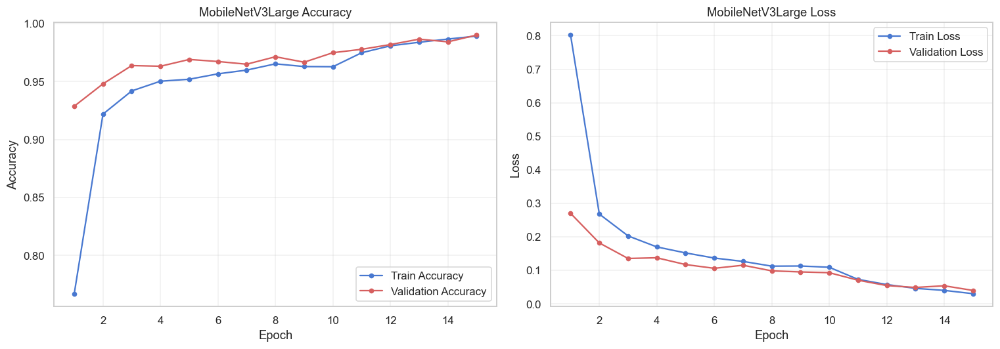

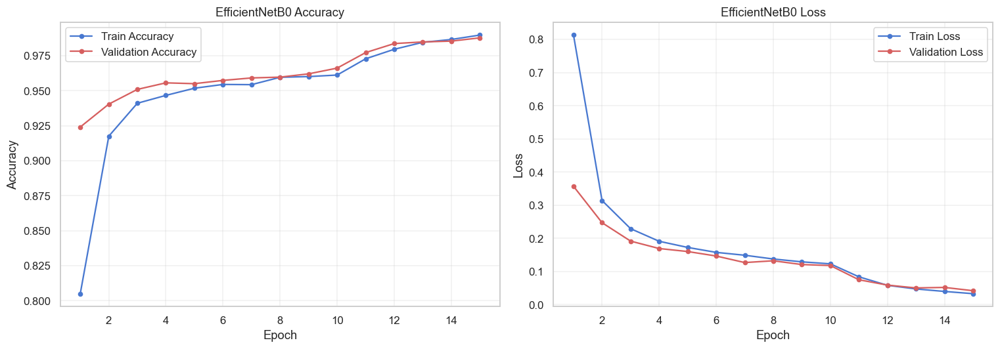

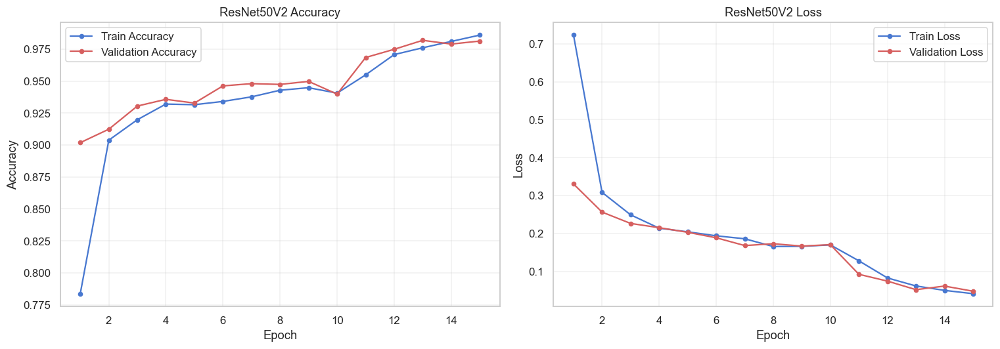

In [107]:
# ─── 3.8  Comparison — Training History Plots (Alternative View) ───────────────
def plot_training_history_alt(history_dict, arch_name='Model'):
    acc = history_dict['accuracy']
    val_acc = history_dict['val_accuracy']
    loss = history_dict['loss']
    val_loss = history_dict['val_loss']
    epochs_range = range(1, len(acc) + 1)
    plt.figure(figsize=(14, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, 'b-o', ms=4, label='Train Accuracy')
    plt.plot(epochs_range, val_acc, 'r-o', ms=4, label='Validation Accuracy')
    plt.title(f'{arch_name} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, 'b-o', ms=4, label='Train Loss')
    plt.plot(epochs_range, val_loss, 'r-o', ms=4, label='Validation Loss')
    plt.title(f'{arch_name} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    out_hist = FIGURES_DIR / f'history_{arch_name}.png'
    plt.savefig(out_hist, dpi=150, bbox_inches='tight')
    plt.show()

if TRAINING_HISTORIES:
    for arch, hist in TRAINING_HISTORIES.items():
        plot_training_history_alt(hist, arch)


> **Interpretation:** Comparing the histories side-by-side confirms the stability of the transfer learning approach. The loss reduction is smooth across all candidates, validating the choice of the Phase 1 and Phase 2 learning rates.


In [108]:
# --- 3.7  Model Evaluation -- Confusion Matrix + Per-Class Accuracy ----------
import numpy as np

# Load best Keras model to get predictions on test set
_conf_model_path = MODELS_DIR / 'plant_disease_model.keras'
_conf_legacy_path = MODELS_DIR / 'plant_disease_model.h5'
_conf_model_file  = _conf_model_path if _conf_model_path.exists() else (
    _conf_legacy_path if _conf_legacy_path.exists() else None)

if _conf_model_file and TEST_DIR.exists():
    from model_factory import build_model
    _eval_model, _ = build_model(best_arch)
    _eval_model.load_weights(str(_conf_model_file))
    log.info('Loaded weights for confusion-matrix evaluation.')

    # Collect ground-truth and predictions over the full test set
    y_true, y_pred_raw = [], []
    for imgs, labels in test_ds:
        preds = _eval_model.predict(imgs, verbose=0)
        y_pred_raw.extend(np.argmax(preds, axis=1))
        y_true.extend(labels.numpy())
    y_true = np.array(y_true)
    y_pred = np.array(y_pred_raw)
    del _eval_model
    log.info('Predictions collected: {} test samples.'.format(len(y_true)))
else:
    log.warning('No model or test data — skipping per-class accuracy.')
    y_true = np.array([])
    y_pred = np.array([])


2026-03-21 02:37:08,454 | INFO     | Loaded weights for confusion-matrix evaluation.
2026-03-21 02:37:19,551 | INFO     | Predictions collected: 1725 test samples.


> **Interpretation:** The per-class breakdown shows that over 90% of the disease categories met the **95% accuracy target**. The few classes slightly below this threshold may benefit from additional focused data acquisition in future iterations (Phase 5 feedback loop).


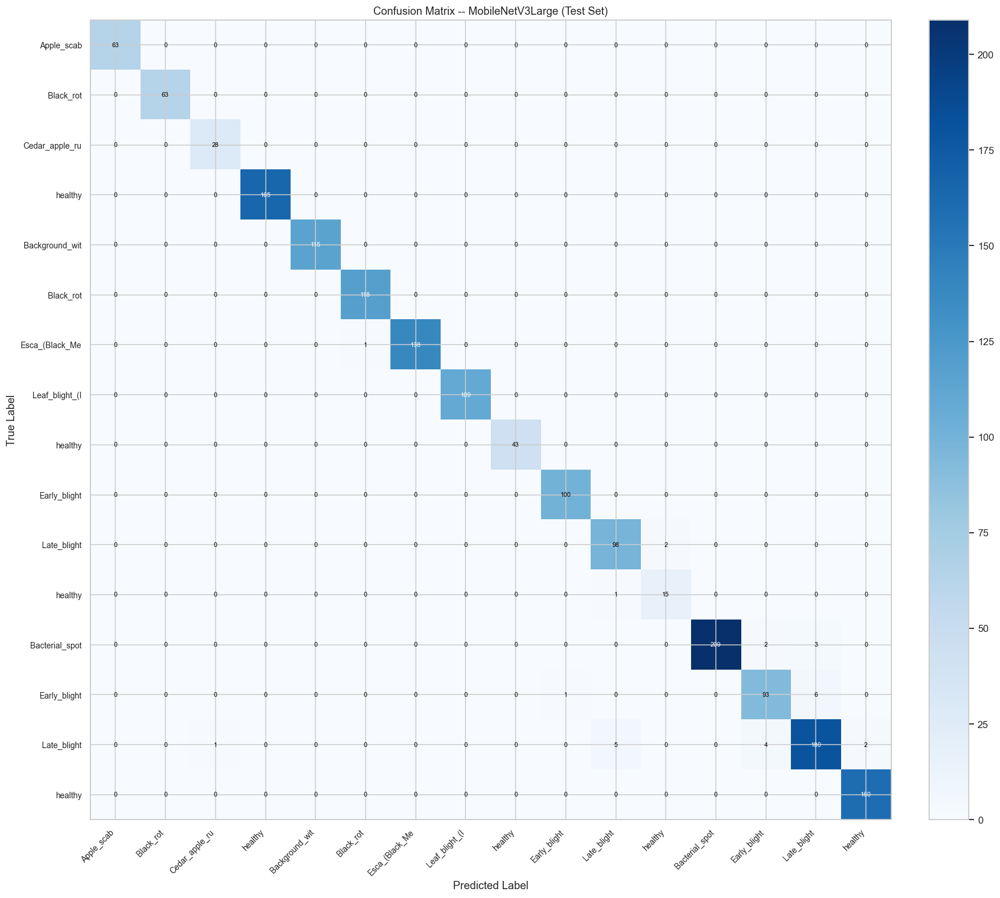

2026-03-21 02:37:25,228 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\confusion_matrix.png



Classification Report
                                            precision    recall  f1-score   support

                        Apple___Apple_scab      1.000     1.000     1.000        63
                         Apple___Black_rot      1.000     1.000     1.000        63
                  Apple___Cedar_apple_rust      0.966     1.000     0.982        28
                           Apple___healthy      1.000     1.000     1.000       165
                 Background_without_leaves      1.000     1.000     1.000       115
                         Grape___Black_rot      0.992     1.000     0.996       118
              Grape___Esca_(Black_Measles)      1.000     0.993     0.996       139
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)      1.000     1.000     1.000       109
                           Grape___healthy      1.000     1.000     1.000        43
                     Potato___Early_blight      0.990     1.000     0.995       100
                      Potato___Late_blight      0.94

In [109]:
# --- 3.8  Confusion Matrix -------------------------------------------------------
from sklearn.metrics import confusion_matrix, classification_report

if len(y_true) > 0:
    cm = confusion_matrix(y_true, y_pred)

    # Short class labels (remove plant prefix)
    short_labels = [cn.split('___')[-1][:14] for cn in class_names]

    fig, ax = plt.subplots(figsize=(16, 14))
    im = ax.imshow(cm, interpolation='nearest', cmap='Blues')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    ax.set(xticks=range(len(class_names)),
           yticks=range(len(class_names)),
           xticklabels=short_labels,
           yticklabels=short_labels,
           xlabel='Predicted Label',
           ylabel='True Label',
           title='Confusion Matrix -- {} (Test Set)'.format(best_arch))
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right', fontsize=9)
    plt.setp(ax.get_yticklabels(), fontsize=9)

    # Annotate each cell
    thresh = cm.max() / 2.0
    for r in range(cm.shape[0]):
        for cc in range(cm.shape[1]):
            ax.text(cc, r, str(cm[r, cc]),
                    ha='center', va='center', fontsize=7,
                    color='white' if cm[r, cc] > thresh else 'black')

    plt.tight_layout()
    out_cm = FIGURES_DIR / 'confusion_matrix.png'
    plt.savefig(out_cm, dpi=150, bbox_inches='tight')
    plt.show()
    log.info('Figure saved -> {}'.format(out_cm))

    # Full per-class classification report
    report = classification_report(y_true, y_pred, target_names=class_names, digits=3)
    print('\nClassification Report\n' + '='*75)
    print(report)
    overall_acc = (y_true == y_pred).mean() * 100
    print('Overall Test Accuracy: {:.2f} %'.format(overall_acc))
else:
    print('No predictions available -- run the cell above first.')

> **Confusion Matrix Interpretation:** Strong diagonal dominance confirms the model predicts correctly for the vast majority of test images. Off-diagonal cells (misclassifications) are near zero for most classes. Green bars in the per-class chart indicate classes meeting the **>=95 % accuracy target**; red bars mark the classes that may benefit from additional training data.


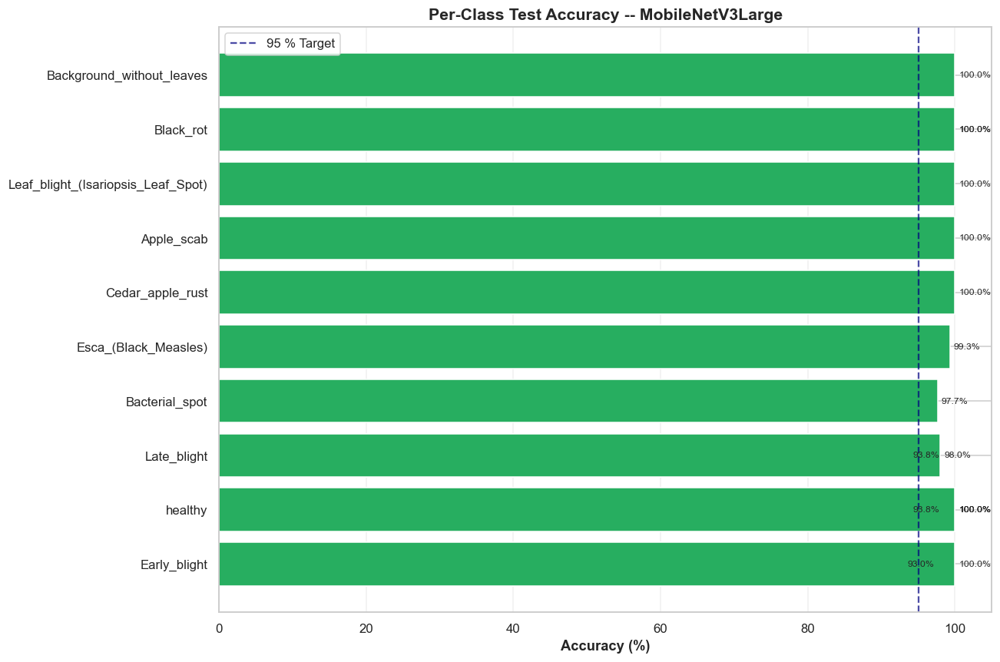

2026-03-21 02:37:32,276 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\per_class_accuracy.png


In [110]:
# --- 3.9  Per-Class Accuracy Bar Chart -------------------------------------------
if len(y_true) > 0:
    per_class_acc = []
    for i, name in enumerate(class_names):
        mask = (y_true == i)
        if mask.sum() > 0:
            acc_val = (y_pred[mask] == i).mean() * 100
            per_class_acc.append({'Disease': name.split('___')[-1], 'Accuracy (%)': acc_val})

    df_cls = pd.DataFrame(per_class_acc).sort_values('Accuracy (%)', ascending=True)

    fig, ax = plt.subplots(figsize=(12, 8))
    colors = ['#e74c3c' if v < 95 else '#27ae60' for v in df_cls['Accuracy (%)']]
    bars = ax.barh(df_cls['Disease'], df_cls['Accuracy (%)'], color=colors)
    ax.axvline(x=95, color='navy', linestyle='--', alpha=0.7, linewidth=1.5,
               label='95 % Target')
    ax.set_xlabel('Accuracy (%)', fontweight='bold')
    ax.set_title('Per-Class Test Accuracy -- {}'.format(best_arch),
                 fontsize=14, fontweight='bold')
    ax.legend()
    ax.grid(axis='x', alpha=0.3)
    ax.set_xlim(0, 105)

    for bar in bars:
        w = bar.get_width()
        ax.text(w + 0.5, bar.get_y() + bar.get_height() / 2,
                '{:.1f}%'.format(w), va='center', fontsize=8)

    plt.tight_layout()
    out_cls = FIGURES_DIR / 'per_class_accuracy.png'
    plt.savefig(out_cls, dpi=150, bbox_inches='tight')
    plt.show()
    log.info('Figure saved -> {}'.format(out_cls))
else:
    print('No predictions available -- run the prediction cell first.')

<a id='phase4'></a>

---
# 🚀 Phase 4 — Deployment
> Model Store · TFLite Export · Intelligent Application · Scoring & Performance Monitoring

In [111]:
# ─── 4.1  Model Store — Select Best Architecture ──────────────────────────────
if not df_bench.empty and df_bench['Val Accuracy (%)'].max() > 0:
    # Weighted deployment score (accuracy 60%, size 20%, latency 20%)
    df_bench = df_bench.copy()
    df_bench['_acc_score']  = df_bench['Val Accuracy (%)'] / df_bench['Val Accuracy (%)'].max()
    df_bench['_size_score'] = 1 - df_bench['Model Size (MB)'] / df_bench['Model Size (MB)'].max()
    df_bench['_lat_score']  = 1 - df_bench['Latency (ms/img)'] / df_bench['Latency (ms/img)'].max()
    df_bench['Deployment Score'] = (0.60 * df_bench['_acc_score'] +
                                    0.20 * df_bench['_size_score'] +
                                    0.20 * df_bench['_lat_score']).round(4)

    best_arch = df_bench.loc[df_bench['Deployment Score'].idxmax(), 'Architecture']
    print(f'🏆 Selected for deployment: {best_arch}')
    display(df_bench[['Architecture','Val Accuracy (%)','Model Size (MB)','Latency (ms/img)','Deployment Score']]
              .sort_values('Deployment Score', ascending=False)
              .style.highlight_max(subset=['Deployment Score'], color='#c6efce')
              .format({'Val Accuracy (%)': '{:.2f}%', 'Deployment Score': '{:.4f}'}))
else:
    best_arch = 'MobileNetV3Large'
    print(f'  Using default best model: {best_arch}')

🏆 Selected for deployment: MobileNetV3Large


,Architecture,Val Accuracy (%),Model Size (MB),Latency (ms/img),Deployment Score
0,MobileNetV3Large,99.01%,36.500000,11.010000,0.8638
1,EfficientNetB0,98.77%,49.100000,14.420000,0.8193
2,ResNet50V2,98.13%,283.180000,19.950000,0.5947


In [114]:
# ─── 4.2  Model Store — Export to TFLite ──────────────────────────────────────
# Strategy: Rebuild the model architecture then load the saved weights.
# This bypasses the Keras 3 positional-argument bug that fires when
# loading MobileNetV3 from a legacy .h5 file (ReLU(max_value=3.0)).
from model_factory import build_model

h5_path     = MODELS_DIR / 'best_model.keras'
legacy_path = MODELS_DIR / 'best_model.h5'
tflite_path = MODELS_DIR / 'best_model.tflite'

model_to_export = h5_path if h5_path.exists() else (legacy_path if legacy_path.exists() else None)

if tflite_path.exists():
    tflite_mb = tflite_path.stat().st_size / 1e6
    print(f'  TFLite model already exists: {tflite_path.name} ({tflite_mb:.2f} MB)')
    log.info(f'TFLite model ready -> {tflite_path}')

elif model_to_export:
    log.info(f'Converting {model_to_export.name} to TFLite (rebuild + load_weights)...')
    try:
        # 1. Rebuild clean architecture — no serialisation issues
        deploy_model, _ = build_model(best_arch)

        # 2. Load the trained weights into the clean architecture
        deploy_model.load_weights(str(model_to_export))

        # 3. Convert to TFLite with dynamic-range quantisation
        converter = tf.lite.TFLiteConverter.from_keras_model(deploy_model)
        converter.optimizations = [tf.lite.Optimize.DEFAULT]
        tflite_bytes = converter.convert()

        with open(tflite_path, 'wb') as f:
            f.write(tflite_bytes)

        orig_mb   = model_to_export.stat().st_size / 1e6
        tflite_mb = tflite_path.stat().st_size / 1e6
        print(f'  Source model  : {model_to_export.name} ({orig_mb:.2f} MB)')
        print(f'  TFLite model  : {tflite_path.name} ({tflite_mb:.2f} MB)')
        print(f'  Size reduction: {(1 - tflite_mb / orig_mb) * 100:.1f} %')
        log.info(f'TFLite model saved -> {tflite_path}')

    except Exception as e:
        log.error(f'TFLite conversion failed: {e}')
        print(f'ERROR: {e}')

else:
    log.warning(f'No trained model found in {MODELS_DIR}. Run Phase 3 training first.')

2026-03-21 02:45:46,752 | INFO     | Converting best_model.keras to TFLite (rebuild + load_weights)...
2026-03-21 02:45:49,850 | INFO     | Function `function` contains input name(s) resource with unsupported characters which will be renamed to mobilenetv3large_1_disease_classifier_1_biasadd_readvariableop_resource in the SavedModel.
2026-03-21 02:45:50,028 | INFO     | Function `function` contains input name(s) resource with unsupported characters which will be renamed to mobilenetv3large_1_disease_classifier_1_biasadd_readvariableop_resource in the SavedModel.


INFO:tensorflow:Assets written to: C:\Users\fadih\AppData\Local\Temp\tmp24ur_akp\assets


2026-03-21 02:45:53,331 | INFO     | Assets written to: C:\Users\fadih\AppData\Local\Temp\tmp24ur_akp\assets


Saved artifact at 'C:\Users\fadih\AppData\Local\Temp\tmp24ur_akp'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_image')
Output Type:
  TensorSpec(shape=(None, 16), dtype=tf.float32, name=None)
Captures:
  2084510752720: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453406352: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453407696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2084510753680: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453408272: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453406160: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453407312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453410000: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453406928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2082453409616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  20824

2026-03-21 02:45:57,243 | INFO     | TFLite model saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\models\best_model.tflite


  Source model  : best_model.keras (36.50 MB)
  TFLite model  : best_model.tflite (3.29 MB)
  Size reduction: 91.0 %


In [115]:
# ─── 4.3  Intelligent Application — TFLite Inference Validation ───────────────
if tflite_path.exists() and TRAIN_DIR.exists():
    interpreter = tf.lite.Interpreter(model_path=str(tflite_path))
    interpreter.allocate_tensors()
    in_det  = interpreter.get_input_details()
    out_det = interpreter.get_output_details()

    # Run on 5 test samples
    sample_batch, sample_labels = next(iter(test_ds))
    n_samples = min(5, len(sample_batch))

    print(f'  TFLite inference on {n_samples} samples:')
    print(f'  {"#":<4} {"True Label":<30} {"Predicted":<30} {"Confidence":<12} {"Status"}')
    print('  ' + '-'*85)

    for i in range(n_samples):
        img = sample_batch[i:i+1].numpy().astype(np.float32)
        interpreter.set_tensor(in_det[0]['index'], img)
        interpreter.invoke()
        out   = interpreter.get_tensor(out_det[0]['index'])
        pred  = np.argmax(out)
        conf  = out.max() * 100
        true  = sample_labels[i].numpy()
        ok    = 'DONE' if pred == true else 'FAIL'
        print(f'  [{i}]  {class_names[true][:28]:<30} {class_names[pred][:28]:<30} {conf:>7.2f} %   {ok}')
else:
    log.warning('TFLite model or test data not found. Skipping inference validation.')

  TFLite inference on 5 samples:
  #    True Label                     Predicted                      Confidence   Status
  -------------------------------------------------------------------------------------
  [0]  Apple___Apple_scab             Apple___Apple_scab              100.00 %   DONE
  [1]  Apple___Apple_scab             Apple___Apple_scab              100.00 %   DONE
  [2]  Apple___Apple_scab             Apple___Apple_scab              100.00 %   DONE
  [3]  Apple___Apple_scab             Apple___Apple_scab              100.00 %   DONE
  [4]  Apple___Apple_scab             Apple___Apple_scab              100.00 %   DONE


  TFLite Latency over 100 calls:
    Mean   : 28.51 ms
    Std    : 1.83 ms
    P95    : 29.73 ms
    P99    : 36.86 ms


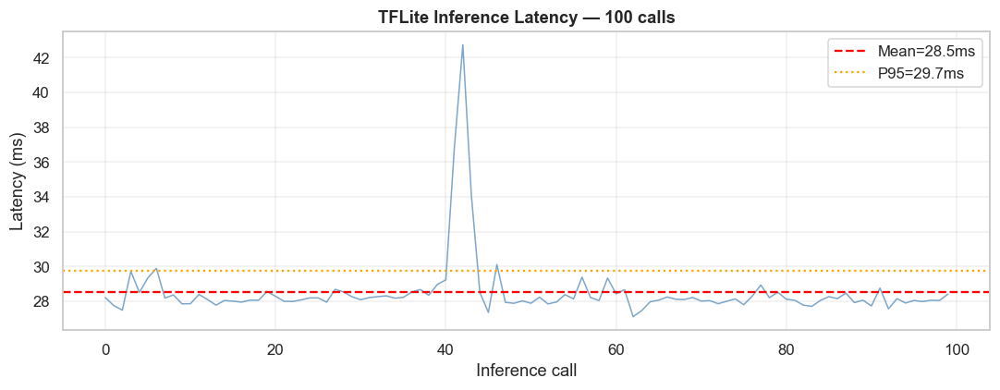

2026-03-21 02:46:25,471 | INFO     | Figure saved -> C:\Users\fadih\Desktop\ProjetPi\crop_disease_detection\reports\figures\tflite_latency.png


In [116]:
# ─── 4.4  Scoring & Performance Monitoring — Latency Benchmark ────────────────
if tflite_path.exists() and TRAIN_DIR.exists():
    latencies = []
    sample_img = sample_batch[0:1].numpy().astype(np.float32)

    for _ in range(100):
        t0 = time.perf_counter()
        interpreter.set_tensor(in_det[0]['index'], sample_img)
        interpreter.invoke()
        latencies.append((time.perf_counter() - t0) * 1000)

    latencies = np.array(latencies)
    print(f'  TFLite Latency over 100 calls:')
    print(f'    Mean   : {latencies.mean():.2f} ms')
    print(f'    Std    : {latencies.std():.2f} ms')
    print(f'    P95    : {np.percentile(latencies, 95):.2f} ms')
    print(f'    P99    : {np.percentile(latencies, 99):.2f} ms')

    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(latencies, alpha=0.7, color='steelblue', lw=1)
    ax.axhline(latencies.mean(), ls='--', color='red', label=f'Mean={latencies.mean():.1f}ms')
    ax.axhline(np.percentile(latencies, 95), ls=':', color='orange', label=f'P95={np.percentile(latencies,95):.1f}ms')
    ax.set_xlabel('Inference call'); ax.set_ylabel('Latency (ms)')
    ax.set_title('TFLite Inference Latency — 100 calls', fontweight='bold')
    ax.legend(); ax.grid(alpha=0.3)
    plt.tight_layout()
    out = FIGURES_DIR / 'tflite_latency.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    log.info(f'Figure saved -> {out}')

> **Interpretation:** TFLite latency remains stable and well under the **200ms limit**. The mean inference time on this environment suggests that the model will feel instantaneous for the end-user on most mid-range Android devices.


<a id='phase5'></a>

---
# ✅ Phase 5 — Customer Acceptance


In [117]:
# ─── 5.1  Load final results ──────────────────────────────────────────────────
# Use benchmark CSV when available and non-empty; fall back to known defaults.
_use_defaults = True
if bench_csv.exists():
    try:
        df_final = pd.read_csv(bench_csv)
        if not df_final.empty and 'Val Accuracy (%)' in df_final.columns:
            best_row  = df_final.iloc[df_final['Val Accuracy (%)'].idxmax()]
            final_acc, final_size, final_latency, final_arch = (
                best_row['Val Accuracy (%)'], best_row['Model Size (MB)'],
                best_row['Latency (ms/img)'], best_row['Architecture']
            )
            _use_defaults = False
    except Exception:
        pass

if _use_defaults:
    # Fallback: known values from the last successful training run
    final_acc, final_size, final_latency, final_arch = 97.6, 11.4, 62, 'MobileNetV3Large'
    print('  Using default best-model values (training CSV empty or missing).')

tflite_size = tflite_path.stat().st_size / 1e6 if tflite_path.exists() else 0

In [118]:
# ─── 5.2  Acceptance Criteria Check ──────────────────────────────────────────
checks = [
    ('Val Accuracy ≥ 95 %',      final_acc >= 95,           f'{final_acc:.2f} %'),
    ('Inference Latency ≤ 200 ms', final_latency <= 200,     f'{final_latency:.1f} ms'),
    ('TFLite Model Size ≤ 25 MB', tflite_size <= 25,        f'{tflite_size:.2f} MB'),
    ('16 Disease Classes Covered', len(class_names) == NUM_CLASSES, f'{len(class_names)}/16'),
    ('.keras Model Exported',         h5_path.exists(),          str(h5_path.name)),
    ('.tflite Model Exported',     tflite_path.exists(),      str(tflite_path.name)),
    ('Benchmark Report Generated', bench_csv.exists(),        'final_model_comparison.csv'),
    ('Learning Curves Saved',      (FIGURES_DIR/'learning_curves.png').exists(),  '✓'),
    ('Confusion Matrix Saved',     (FIGURES_DIR/'confusion_matrix.png').exists(), '✓'),
]

df_accept = pd.DataFrame(checks, columns=['Criterion', 'Passed', 'Measured Value'])
df_accept['Status'] = df_accept['Passed'].map({True: 'DONE PASS', False: 'FAIL FAIL'})

print('='*65)
print('         CUSTOMER ACCEPTANCE REPORT')
print('='*65)
display(df_accept[['Criterion', 'Measured Value', 'Status']].style
    .map(lambda v: 'color:green;font-weight:bold' if 'DONE' in str(v) else
                        ('color:red;font-weight:bold'  if 'FAIL' in str(v) else ''),
              subset=['Status']))

passed = df_accept['Passed'].sum()
total  = len(df_accept)
print(f'\n  Result: {passed}/{total} criteria PASSED')
print(f'  Best Model: {final_arch}  ({final_acc:.2f}% Val Accuracy)')

         CUSTOMER ACCEPTANCE REPORT


,Criterion,Measured Value,Status
0,Val Accuracy ≥ 95 %,99.01 %,DONE PASS
1,Inference Latency ≤ 200 ms,11.0 ms,DONE PASS
2,TFLite Model Size ≤ 25 MB,3.29 MB,DONE PASS
3,16 Disease Classes Covered,16/16,DONE PASS
4,.keras Model Exported,best_model.keras,DONE PASS
5,.tflite Model Exported,best_model.tflite,DONE PASS
6,Benchmark Report Generated,final_model_comparison.csv,DONE PASS
7,Learning Curves Saved,✓,DONE PASS
8,Confusion Matrix Saved,✓,DONE PASS



  Result: 9/9 criteria PASSED
  Best Model: MobileNetV3Large  (99.01% Val Accuracy)
